# This cat does not exist
__Суммарное количество баллов: 10__

__Решение отправлять на `ml.course.practice@gmail.com`__

__Тема письма: `[HSE][ML][MS][HW06] <ФИО>`, где вместо `<ФИО>` указаны фамилия и имя__

Цель этого задания - создать котов, которых не существует. В ходе данного задания вы обучите DCGAN и VAE, которые являются одними из первых генеративных моделей. Для этого задания вам наверняка потребуется GPU с CUDA, поэтому рекомендуется использовать Google Colab.

In [1]:
import torch
from torch import nn
from torch.optim import Adam
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader
import os 
import cv2
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import random
import numpy as np

%matplotlib inline

In [2]:
def random_noise(batch_size, channels, side_size):
    return torch.randn(batch_size, channels, side_size, side_size).cuda()

def imagewide_average(x):
    return x.mean(dim=(-1, -2))

In [3]:
def visualise(imgs, rows=2):
    imgs = (imgs.transpose(1, 3) + 1) / 2
    imgs = torch.cat([imgs[i::rows] for i in range(rows)], dim=1)
    cols = len(imgs)
    imgs = (torch.cat(list(imgs), dim=1)).cpu().numpy()[:, :, ::-1]
    plt.figure(figsize=(cols*1.5, rows*1.5))
    plt.imshow(imgs)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

In [4]:
class CatDataset(Dataset):
    def __init__(self, path_to_dataset="cat_136", size=64):
        self.photo_names = os.listdir(path_to_dataset)
        self.path_base = path_to_dataset
        self.size = size
    
    def __getitem__(self, index):
        path = self.path_base + "/" + self.photo_names[index]
        img = cv2.imread(path) # 136 x 136
        crop_rate = 8
        x_crop = random.randint(0, crop_rate)
        y_crop = random.randint(0, crop_rate)
        img = img[x_crop:136 - crop_rate + x_crop, y_crop:136 - crop_rate + y_crop]
        img = cv2.resize(img, (self.size, self.size), interpolation=cv2.INTER_CUBIC)
        return 2 * torch.tensor(img).float().transpose(0, 2) / 255. - 1
    
    def __len__(self):
        return len(self.photo_names)

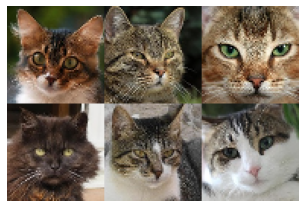

In [5]:
dataset = CatDataset()
visualise(torch.cat([dataset[i].unsqueeze(0) for i in [3, 15, 182, 592, 394, 2941]], dim=0))

### Задание 1 (2 балла)
Для начала реализуем генератор для нашего DCGAN. Предлагается использовать следующую архитектуру:

![](imgs/DCGAN.png)

Для ее реализации вам потребуются модули `nn.BatchNorm2d`, `nn.Conv2d`, `nn.ConvTranspose2D`, `nn.ReLU`, а также функция `F.interpolate`.

#### Методы
* `__init__` - принимает на вход `start_size`, `latent_channels`, `start_channels` и `upsamplings`. Первые два аргумента отвечают за размер случайного шума, из которого в последствии будет сгенерирована картинка. `start_channels` отвечает за то, сколько каналов должно быть в картинке перед тем, как к ней будут применены upsampling блоки. `upsamplings` - это количество upsampling блоков, которые должны быть применены к картинке. В каждом таком локе количество каналов уменьшается в два раза.


* `forward` - принимает на вход `batch_size`, генерирует `batch_size` картинок из случайного шума.

In [6]:
class Generator(nn.Module):
    def __init__(self, start_size=2, latent_channels=32, start_channels=1024, upsamplings=6):
        super().__init__()
        self.start_size = start_size
        self.latent_channels = latent_channels
        self.conv_1 = nn.Conv2d(latent_channels, start_channels, kernel_size=1, stride=1, padding=0)

        upscaler = []
        c_in = start_channels
        for _ in range(upsamplings):
            c_out = c_in // 2
            upscaler.append(nn.ConvTranspose2d(c_in, c_out, kernel_size=4, stride=2, padding=1))
            upscaler.append(nn.BatchNorm2d(c_out))
            upscaler.append(nn.ReLU())
            c_in = c_out
        self.upscaler = nn.Sequential(*upscaler)

        self.conv_2 = nn.Conv2d(c_out, 3, kernel_size=1, stride=1, padding=0)

    def forward(self, batch_size: int):
        x = random_noise(batch_size, self.latent_channels, self.start_size)
        x = self.conv_1(x)
        x = self.upscaler(x)
        x = torch.tanh(self.conv_2(x))
        return x # torch.Tensor batch_size x 3 x (start_size * 2**upsamplings) x (start_size * 2**upsamplings)

### Задание 2 (2 балла)
Для начала реализуем дискриминатор для нашего DCGAN. Предлагается использовать следующую архитектуру:

![](imgs/Disc_DCGAN.png)

Для ее реализации вам потребуются модули `nn.BatchNorm2d`, `nn.Conv2d`, `nn.ReLU` и `nn.Sigmoid`.

#### Методы
* `__init__` - принимает на вход `start_channels` и `downsamplings`. `start_channels` определяет количество каналов, которые должны быть в изображении перед применением downsampling блоков.


* `forward` - принимает на вход `x` - тензор с картинками. Возвращает вектор с размерностью `batch_size`.

In [7]:
class Discriminator(nn.Module):
    def __init__(self, image_size, downsamplings=6, start_channels=8):
        super().__init__()
        self.conv_in = nn.Conv2d(3, start_channels, kernel_size=1, stride=1, padding=0)

        downsampler = []
        c_in = start_channels
        for _ in range(downsamplings):
            c_out = c_in * 2
            downsampler.append(nn.Conv2d(c_in, c_out, kernel_size=3, stride=2, padding=1))
            downsampler.append(nn.BatchNorm2d(c_out))
            downsampler.append(nn.ReLU())
            c_in = c_out
            image_size = int(np.ceil(image_size / 2))
        self.downsampler = nn.Sequential(*downsampler)

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(c_out * image_size**2, 1),
            nn.Sigmoid(),
        )

    def forward(self, x):
        x = self.conv_in(x)
        x = self.downsampler(x)
        x = self.classifier(x)
        return x # torch.Tensor batch_size x 1

In [8]:
def train_gan(epochs=120, lr=1e-4, visualise_every=10, batch_size=8):
    generator = Generator()
    discriminator = Discriminator(128)
    generator.cuda()
    discriminator.cuda()

    gen_optim = Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    disc_optim = Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

    dataset = CatDataset(size=128)

    for ep in range(epochs):
        dataloader = DataLoader(dataset, shuffle=True, batch_size=batch_size)
        total_batches = 0
        gen_loss_avg = 0
        disc_loss_avg = 0

        for i, batch in tqdm(enumerate(dataloader), total=(len(dataset) + batch_size) // batch_size):
            if len(batch) < batch_size:
                continue
            total_batches += 1
            # Positive update
            batch = batch.cuda()
            pred = discriminator(batch)
            loss = F.binary_cross_entropy(pred, torch.ones_like(pred))
            disc_optim.zero_grad()
            loss.backward()
            disc_optim.step()
            disc_loss_avg += loss.item()

            # Negative update
            batch = generator(batch_size).detach()
            pred = discriminator(batch)
            loss = F.binary_cross_entropy(pred, torch.zeros_like(pred))
            disc_optim.zero_grad()
            loss.backward()
            disc_optim.step()
            disc_loss_avg += loss.item()

            # Generator update
            batch = generator(batch_size)
            pred = discriminator(batch)
            loss = F.binary_cross_entropy(pred, torch.ones_like(pred))
            gen_optim.zero_grad()
            loss.backward()
            gen_optim.step()
            gen_loss_avg += loss.item()
            
        if (ep + 1) % visualise_every == 0:
            with torch.no_grad():
                visualise(generator(6), rows=2)
        
        disc_loss = disc_loss_avg / total_batches
        gen_loss = gen_loss_avg / total_batches
        print(f"Epoch {ep+1} | Discriminator loss: {disc_loss} | Generator loss: {gen_loss}")
        if gen_loss / disc_loss > 100:
            return

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 1 | Discriminator loss: 0.17507049505515287 | Generator loss: 5.3785031770141964


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 2 | Discriminator loss: 0.6966875908250619 | Generator loss: 2.947859127329003


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 3 | Discriminator loss: 1.0035105725889157 | Generator loss: 1.9930435631030834


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 4 | Discriminator loss: 1.0895928500324303 | Generator loss: 1.5768218336638458


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 5 | Discriminator loss: 1.0965048673870736 | Generator loss: 1.505461141281987


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 6 | Discriminator loss: 1.1261277886697594 | Generator loss: 1.4273872477297458


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 7 | Discriminator loss: 1.1024471959272713 | Generator loss: 1.4125621210529198


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 8 | Discriminator loss: 1.0915537111530578 | Generator loss: 1.4441509478210663


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 9 | Discriminator loss: 1.061494862938427 | Generator loss: 1.499511912279988


  0%|          | 0/645 [00:00<?, ?it/s]

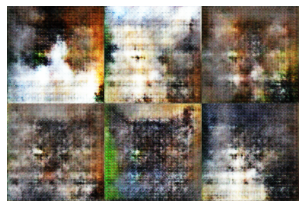

Epoch 10 | Discriminator loss: 1.0478680351436693 | Generator loss: 1.5234190624508057


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 11 | Discriminator loss: 0.9777331205883196 | Generator loss: 1.5933607840297386


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 12 | Discriminator loss: 0.9273993980301463 | Generator loss: 1.6782670355639102


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 13 | Discriminator loss: 0.873444155413912 | Generator loss: 1.7267901887249502


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 14 | Discriminator loss: 0.8662321094180578 | Generator loss: 1.7875028204473649


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 15 | Discriminator loss: 0.7843146383565682 | Generator loss: 2.0017523551764698


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 16 | Discriminator loss: 0.7336160764329552 | Generator loss: 2.120739976811853


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 17 | Discriminator loss: 0.7506866149679521 | Generator loss: 2.1281446692828805


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 18 | Discriminator loss: 0.7047888831154484 | Generator loss: 2.208983262595923


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 19 | Discriminator loss: 0.6463901076475969 | Generator loss: 2.331056180115072


  0%|          | 0/645 [00:00<?, ?it/s]

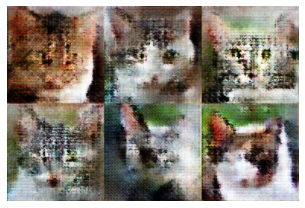

Epoch 20 | Discriminator loss: 0.6235523733696524 | Generator loss: 2.4767298901118107


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 21 | Discriminator loss: 0.589035354099115 | Generator loss: 2.6225924888012573


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 22 | Discriminator loss: 0.5480582485404242 | Generator loss: 2.7424386915583048


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 23 | Discriminator loss: 0.5344477617051684 | Generator loss: 2.8466941830904586


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 24 | Discriminator loss: 0.48767997435748184 | Generator loss: 2.907287233549616


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 25 | Discriminator loss: 0.5092813738698417 | Generator loss: 2.9688979450219906


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 26 | Discriminator loss: 0.4859271968414093 | Generator loss: 3.033787051528137


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 27 | Discriminator loss: 0.4456780447564247 | Generator loss: 3.1064776894838912


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 28 | Discriminator loss: 0.4186388446103604 | Generator loss: 3.2972453113483344


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 29 | Discriminator loss: 0.4273461919474809 | Generator loss: 3.3213304595917648


  0%|          | 0/645 [00:00<?, ?it/s]

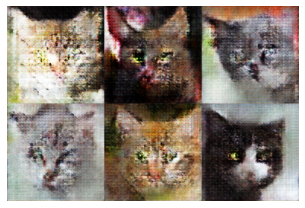

Epoch 30 | Discriminator loss: 0.4086758249764243 | Generator loss: 3.25084491897814


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 31 | Discriminator loss: 0.42196411618166413 | Generator loss: 3.455931993560021


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 32 | Discriminator loss: 0.39242479958934295 | Generator loss: 3.4641077539750507


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 33 | Discriminator loss: 0.4022933803359553 | Generator loss: 3.4423333373129


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 34 | Discriminator loss: 0.4007796246999177 | Generator loss: 3.5344621892671406


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 35 | Discriminator loss: 0.39097668325559415 | Generator loss: 3.508134013007146


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 36 | Discriminator loss: 0.34305863892349525 | Generator loss: 3.728330014470201


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 37 | Discriminator loss: 0.35920599524480107 | Generator loss: 3.7910168388430376


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 38 | Discriminator loss: 0.3612513308704275 | Generator loss: 3.638188552319633


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 39 | Discriminator loss: 0.3513227233307357 | Generator loss: 3.7783465356745336


  0%|          | 0/645 [00:00<?, ?it/s]

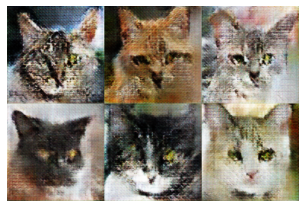

Epoch 40 | Discriminator loss: 0.3668104767747542 | Generator loss: 3.721037454671741


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 41 | Discriminator loss: 0.33687471433307264 | Generator loss: 3.882154176138943


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 42 | Discriminator loss: 0.33902312276383234 | Generator loss: 3.933842079054495


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 43 | Discriminator loss: 0.34681574270362053 | Generator loss: 3.8943279323555666


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 44 | Discriminator loss: 0.32578028369199774 | Generator loss: 3.9118689245411327


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 45 | Discriminator loss: 0.3228634498737841 | Generator loss: 3.9923479177335404


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 46 | Discriminator loss: 0.30946877081489377 | Generator loss: 4.04285984463203


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 47 | Discriminator loss: 0.3296389057817979 | Generator loss: 3.9803601166476374


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 48 | Discriminator loss: 0.3055845441624047 | Generator loss: 4.1311603378249995


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 49 | Discriminator loss: 0.28881471517050394 | Generator loss: 4.2462884477391745


  0%|          | 0/645 [00:00<?, ?it/s]

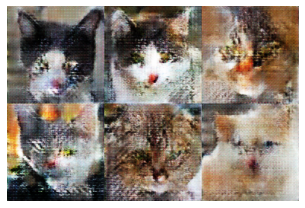

Epoch 50 | Discriminator loss: 0.29026627288367424 | Generator loss: 4.204839387850732


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 51 | Discriminator loss: 0.31605048901427896 | Generator loss: 4.0968307815260765


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 52 | Discriminator loss: 0.2948844604478785 | Generator loss: 4.230728926310628


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 53 | Discriminator loss: 0.29115668957489127 | Generator loss: 4.300520891543501


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 54 | Discriminator loss: 0.2976077209334266 | Generator loss: 4.261572485940056


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 55 | Discriminator loss: 0.24639638279003243 | Generator loss: 4.3280248647521


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 56 | Discriminator loss: 0.266664900840799 | Generator loss: 4.370601348810315


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 57 | Discriminator loss: 0.2533645953831776 | Generator loss: 4.538759601504906


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 58 | Discriminator loss: 0.2670766288874604 | Generator loss: 4.646312752865857


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 59 | Discriminator loss: 0.2498571296007469 | Generator loss: 4.595387824666426


  0%|          | 0/645 [00:00<?, ?it/s]

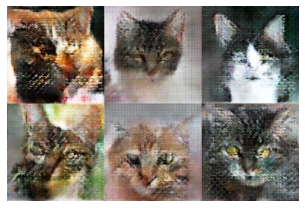

Epoch 60 | Discriminator loss: 0.2830746744962904 | Generator loss: 4.4857085272207025


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 61 | Discriminator loss: 0.2757193952819033 | Generator loss: 4.44271997783495


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 62 | Discriminator loss: 0.2497811987320198 | Generator loss: 4.47368508022024


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 63 | Discriminator loss: 0.25639579376038085 | Generator loss: 4.5844847167500795


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 64 | Discriminator loss: 0.23375281955606048 | Generator loss: 4.576119551747482


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 65 | Discriminator loss: 0.23504586767452149 | Generator loss: 4.822514812305847


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 66 | Discriminator loss: 0.046204386834044896 | Generator loss: 18.06780118194426
CPU times: user 1h 16min 8s, sys: 9.35 s, total: 1h 16min 17s
Wall time: 36min 12s


In [9]:
%%time
train_gan(epochs=120)

### Задание 3 (5 баллов)
Теперь посмотрим на другую модель: Variational Autoencoder. В отличии от GAN, в котором генератор пытается себя обмануть дискриминатор, а дискриминатор старается не быть обманутым, VAE решает задачу реконструкции элемента множества X с применением регуляризации в латентном пространстве. 

Полностью архитектура выглядит так:
![](imgs/VAE.png)

Из нее можно выделить две части: Encoder (по изображению возвращает mu и sigma) и Decoder (по случайному шуму восстанавливает изображение). На высоком уровне VAE можно представить так:

![](imgs/VAE_highlevel.png)

В данном задании вам необходимо реализовать полную архитектуру VAE.

#### Методы
* `__init__` - принимает на вход `img_size`, `downsamplings`, `latent_size`, `linear_hidden_size`, `down_channels` и `up_channels`. `img_size` - размер стороны входного изображения. `downsamplings` - количество downsampling (и upsampling) блоков. `latent_size` - размер латентного пространства, в котором в который будет закодирована картинка. `linear_hidden_size` количество нейронов на скрытом слое полносвязной сети в конце encoder'а. Для полносвязной сети decoder'а это число стоит умножить на 2. `down_channels` - количество каналов, в которое будет преобразовано трехцветное изображение перед применением `downsampling` блоков. `up_channels` - количество каналов, которое должно получиться после применения всех upsampling блоков.

* `forward` - принимает на вход `x`. Считает распределение $N(\mu, \sigma^2)$ и вектор $z \sim N(\mu, \sigma^2)$. Возвращает $x'$ - восстановленную из вектора $z$ картинку и $D_{KL}(N(\mu, \sigma^2), N(0, 1)) = 0.5 \cdot (\sigma^2 + \mu^2 - \log \sigma^2 - 1)$.

* `encode` - принимает на вход `x`. Возвращает вектор из распределения $N(\mu, \sigma^2)$.

* `decode` - принимает на вход `z`. Возвращает восстановленную по вектору картинку.


#### Если хочется улучшить качество
https://arxiv.org/pdf/1906.00446.pdf

In [12]:
class VAE(nn.Module):
    def __init__(self, img_size=128, downsamplings=5, latent_size=512,
                 linear_hidden_size=1024, down_channels=8, up_channels=16):
        super().__init__()
        self.latent_size = latent_size
     
        conv_e1 = nn.Conv2d(3, down_channels, kernel_size=1, stride=1, padding=0)
        dm = []  # downsample modules
        c_in = down_channels
        for _ in range(downsamplings):
            dm.append(nn.Conv2d(c_in, c_in * 2, 3, 2, 1))
            dm.append(nn.BatchNorm2d(c_in * 2))
            dm.append(nn.ReLU())
            c_in *= 2
        conv_e2 = nn.Conv2d(c_in, 2 * latent_size, 1, 1, 0)
        self.encoder = nn.Sequential(conv_e1, *dm, conv_e2)

        conv_d1 = nn.Conv2d(latent_size, c_in * 2, 1, 1, 0)
        um = []  # upsample modules
        c_in *= 2
        while c_in > up_channels:
            um.append(nn.ConvTranspose2d(c_in, c_in // 2, 4, 2, 1))
            c_in //= 2
            um.append(nn.BatchNorm2d(c_in))
            um.append(nn.ReLU())
        assert c_in == up_channels
        conv_d2 = nn.Conv2d(c_in, 3, 1, 1, 0)
        self.decoder = nn.Sequential(conv_d1, *um, conv_d2)
        
    def forward(self, x):
        x = self.encoder(x)
        mu = x[:, :self.latent_size]
        log_sigma = x[:, self.latent_size:]
        sigma = torch.exp(log_sigma)
        kld = 0.5 * (sigma + mu**2 - log_sigma - 1)
        z = mu + sigma * random_noise(x.shape[0], self.latent_size, 1)
        x_pred = self.decode(z)
        return x_pred, kld
    
    def encode(self, x):
        x = self.encoder(x)
        mu = x[:, :self.latent_size]
        sigma = torch.exp(x[:, self.latent_size:])
        z = mu + sigma * random_noise(x.shape[0], self.latent_size, 1)
        return z
    
    def decode(self, z):
        x_pred = torch.tanh(self.decoder(z))
        return x_pred

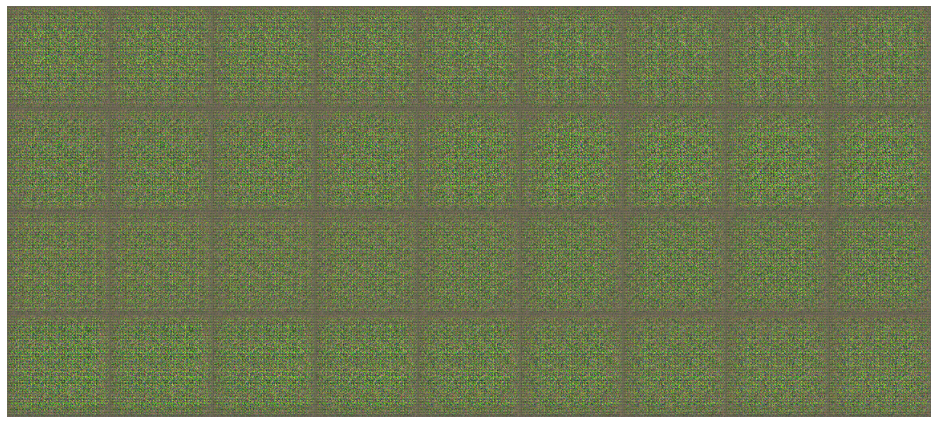

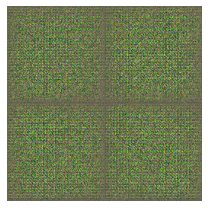

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 1 | Reconstruction loss: 5471.816022221346 | KLD loss: 1346.402600780037


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 2 | Reconstruction loss: 3379.963393312063 | KLD loss: 1558.938524329144


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 3 | Reconstruction loss: 3091.558287816018 | KLD loss: 1620.1722457601418


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 4 | Reconstruction loss: 2961.2895331530835 | KLD loss: 1571.1751591463267


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 5 | Reconstruction loss: 2876.2188462914887 | KLD loss: 1492.7541380698638


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 6 | Reconstruction loss: 2713.42484809449 | KLD loss: 1472.3493769864858


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 7 | Reconstruction loss: 2474.025475353928 | KLD loss: 1507.4803995641862


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 8 | Reconstruction loss: 2394.394545087163 | KLD loss: 1486.5275573730469


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 9 | Reconstruction loss: 2314.250994001116 | KLD loss: 1447.522149696113


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 10 | Reconstruction loss: 2293.454615622574 | KLD loss: 1411.1333667447109


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 11 | Reconstruction loss: 2227.8842225637495 | KLD loss: 1387.1768789350617


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 12 | Reconstruction loss: 2180.5387129694777 | KLD loss: 1358.7102475373642


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 13 | Reconstruction loss: 2143.961701008104 | KLD loss: 1333.8590400648413


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 14 | Reconstruction loss: 2129.169557370014 | KLD loss: 1317.0463571489227


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 15 | Reconstruction loss: 2079.5598777628834 | KLD loss: 1291.112404580442


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 16 | Reconstruction loss: 2048.8629650803086 | KLD loss: 1270.805591464783


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 17 | Reconstruction loss: 2047.8692162555196 | KLD loss: 1261.591857531056


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 18 | Reconstruction loss: 2028.5558502007716 | KLD loss: 1248.531029553147


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 19 | Reconstruction loss: 2008.5681419609496 | KLD loss: 1232.7558163471103


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 20 | Reconstruction loss: 1972.4251447405134 | KLD loss: 1206.9191831979692


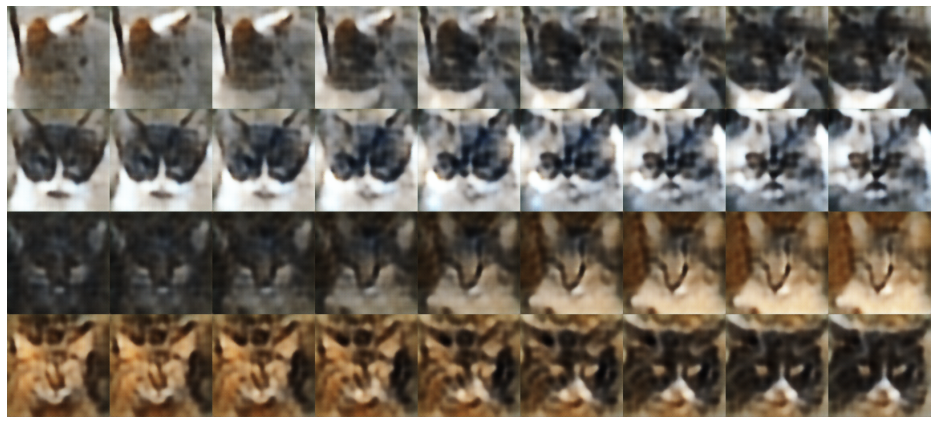

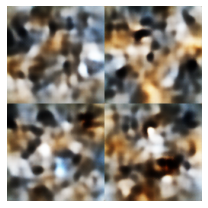

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 21 | Reconstruction loss: 1964.6255531074098 | KLD loss: 1199.2340565557065


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 22 | Reconstruction loss: 1952.8166251804519 | KLD loss: 1189.6045994728988


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 23 | Reconstruction loss: 1918.602519349282 | KLD loss: 1175.8864514842537


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 24 | Reconstruction loss: 1898.546037377778 | KLD loss: 1166.1787105583996


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 25 | Reconstruction loss: 1917.0305475270527 | KLD loss: 1162.470315684443


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 26 | Reconstruction loss: 1892.5371512655886 | KLD loss: 1153.1918027889656


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 27 | Reconstruction loss: 1869.0165083038141 | KLD loss: 1138.3799307686943


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 28 | Reconstruction loss: 1867.287252485382 | KLD loss: 1133.0755410520187


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 29 | Reconstruction loss: 1847.0031270092318 | KLD loss: 1125.3404522060607


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 30 | Reconstruction loss: 1840.8966127952433 | KLD loss: 1115.2037040757837


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 31 | Reconstruction loss: 1834.3308852296439 | KLD loss: 1111.99832892566


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 32 | Reconstruction loss: 1813.4913121572934 | KLD loss: 1102.231264292083


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 33 | Reconstruction loss: 1807.6300381488682 | KLD loss: 1092.075476415409


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 34 | Reconstruction loss: 1811.462010543539 | KLD loss: 1091.9967076082407


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 35 | Reconstruction loss: 1788.7037984717706 | KLD loss: 1075.745083637119


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 36 | Reconstruction loss: 1773.7678075754864 | KLD loss: 1074.4703014681797


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 37 | Reconstruction loss: 1771.2637607740319 | KLD loss: 1065.8719773381392


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 38 | Reconstruction loss: 1779.917796164566 | KLD loss: 1064.696475674647


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 39 | Reconstruction loss: 1755.5908122566175 | KLD loss: 1057.514730986601


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 40 | Reconstruction loss: 1760.1184372043017 | KLD loss: 1056.3472368702385


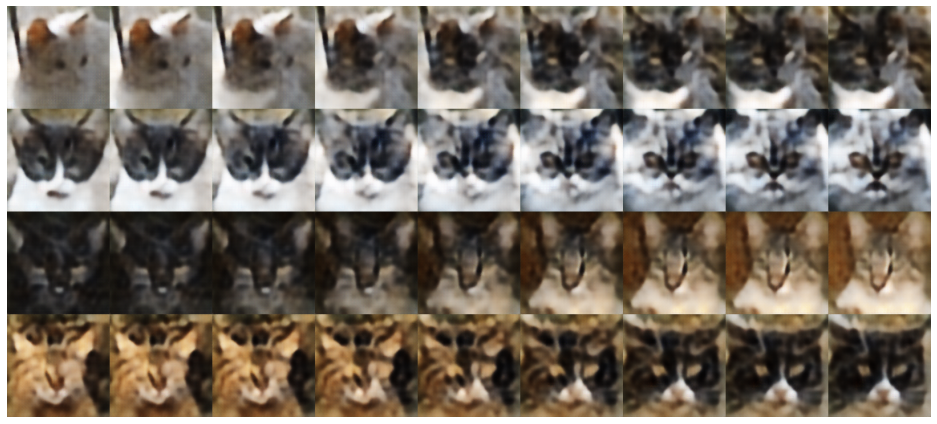

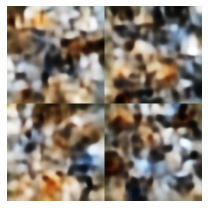

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 41 | Reconstruction loss: 1754.78172747689 | KLD loss: 1049.53172747689


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 42 | Reconstruction loss: 1743.2736855264036 | KLD loss: 1045.6173012301049


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 43 | Reconstruction loss: 1730.311997597262 | KLD loss: 1035.5039124103807


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 44 | Reconstruction loss: 1731.9539546611147 | KLD loss: 1035.8476555865743


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 45 | Reconstruction loss: 1735.8022115008432 | KLD loss: 1028.513638324619


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 46 | Reconstruction loss: 1721.0157760714892 | KLD loss: 1024.4392551398425


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 47 | Reconstruction loss: 1714.4265415357506 | KLD loss: 1017.7916715633795


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 48 | Reconstruction loss: 1711.522086575905 | KLD loss: 1011.9460033156116


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 49 | Reconstruction loss: 1705.1327783809686 | KLD loss: 1009.6876878442231


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 50 | Reconstruction loss: 1702.645162546857 | KLD loss: 1007.3761325622937


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 51 | Reconstruction loss: 1690.1843004878262 | KLD loss: 1001.9979216771096


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 52 | Reconstruction loss: 1700.5661556646692 | KLD loss: 1001.4276878404321


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 53 | Reconstruction loss: 1686.5757842448927 | KLD loss: 992.9374864471625


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 54 | Reconstruction loss: 1677.4517464015794 | KLD loss: 989.1680146211422


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 55 | Reconstruction loss: 1672.740015349773 | KLD loss: 986.6049493825213


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 56 | Reconstruction loss: 1675.0717980994941 | KLD loss: 985.2674270535108


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 57 | Reconstruction loss: 1662.8092484563033 | KLD loss: 979.2514568826426


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 58 | Reconstruction loss: 1665.839011529958 | KLD loss: 977.4719669507897


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 59 | Reconstruction loss: 1670.9467028505314 | KLD loss: 977.6301564281772


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 60 | Reconstruction loss: 1647.6557711962587 | KLD loss: 968.1690003768257


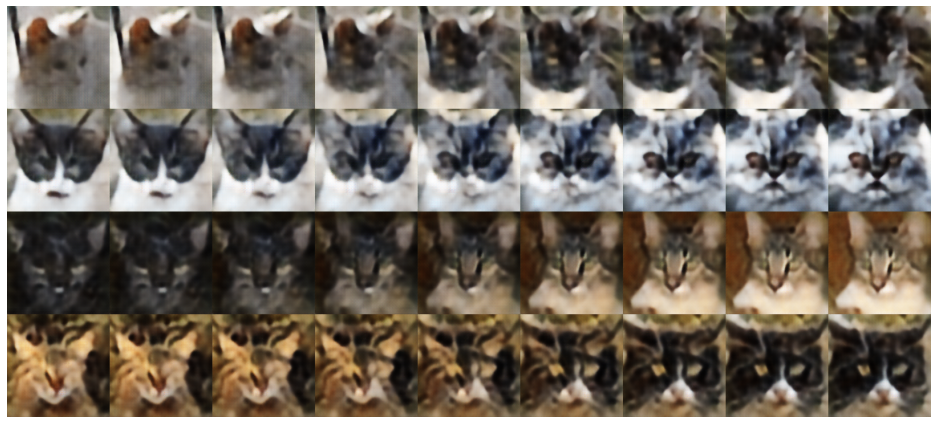

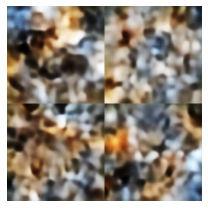

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 61 | Reconstruction loss: 1654.9976134685255 | KLD loss: 973.1070491245815


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 62 | Reconstruction loss: 1643.2671659481452 | KLD loss: 963.9853737398704


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 63 | Reconstruction loss: 1648.7803860303038 | KLD loss: 958.4745842596019


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 64 | Reconstruction loss: 1648.8963495100506 | KLD loss: 961.9161168447932


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 65 | Reconstruction loss: 1634.2913848687404 | KLD loss: 957.0357694448152


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 66 | Reconstruction loss: 1638.8328339949899 | KLD loss: 954.87070848927


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 67 | Reconstruction loss: 1625.2181693130399 | KLD loss: 954.0929754032111


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 68 | Reconstruction loss: 1623.8855745303704 | KLD loss: 954.0083530970982


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 69 | Reconstruction loss: 1617.4239065039972 | KLD loss: 947.100250718016


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 70 | Reconstruction loss: 1612.9322921089504 | KLD loss: 947.9103967891717


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 71 | Reconstruction loss: 1604.8965818037898 | KLD loss: 944.0963779236218


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 72 | Reconstruction loss: 1605.7409564663906 | KLD loss: 947.1837089965062


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 73 | Reconstruction loss: 1588.0547658789972 | KLD loss: 944.4591756311263


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 74 | Reconstruction loss: 1586.9251461621398 | KLD loss: 945.4203041977023


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 75 | Reconstruction loss: 1582.8514339849817 | KLD loss: 945.1468952250036


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 76 | Reconstruction loss: 1570.6036443295686 | KLD loss: 943.5036158591324


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 77 | Reconstruction loss: 1573.892307921226 | KLD loss: 942.2780578802831


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 78 | Reconstruction loss: 1559.8193768803378 | KLD loss: 938.5970494051157


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 79 | Reconstruction loss: 1553.3711690961945 | KLD loss: 939.4945143231694


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 80 | Reconstruction loss: 1545.2472619477267 | KLD loss: 937.0030473981585


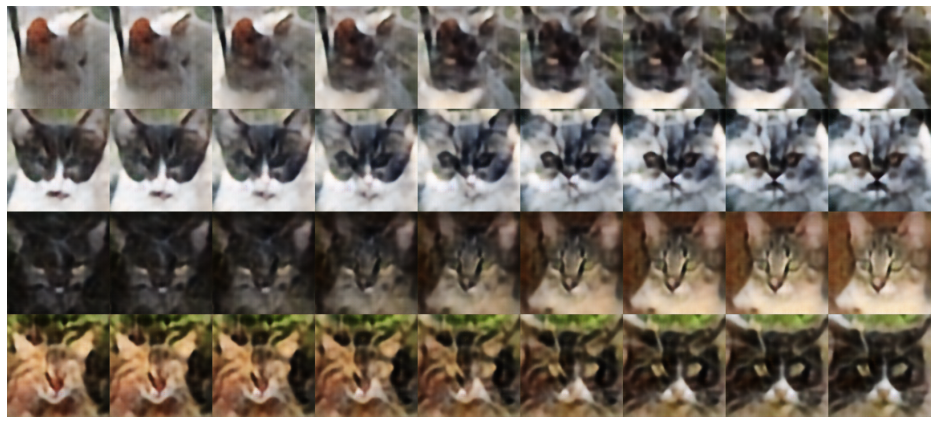

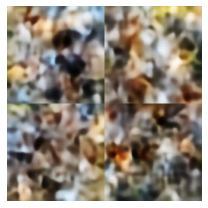

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 81 | Reconstruction loss: 1548.9749462056604 | KLD loss: 936.7576852170577


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 82 | Reconstruction loss: 1550.7452707231414 | KLD loss: 936.2885817059819


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 83 | Reconstruction loss: 1537.3616457163178 | KLD loss: 935.7494150481609


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 84 | Reconstruction loss: 1530.0423928965693 | KLD loss: 934.5336275278411


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 85 | Reconstruction loss: 1518.3273097446986 | KLD loss: 928.3928264357288


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 86 | Reconstruction loss: 1524.3340676823018 | KLD loss: 928.408592650609


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 87 | Reconstruction loss: 1515.5074342526264 | KLD loss: 929.9634134991569


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 88 | Reconstruction loss: 1517.2812029915567 | KLD loss: 931.2541281184795


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 89 | Reconstruction loss: 1509.8241881376468 | KLD loss: 926.2018531183278


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 90 | Reconstruction loss: 1508.289939169558 | KLD loss: 926.752967597535


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 91 | Reconstruction loss: 1506.607975266735 | KLD loss: 925.2991846688786


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 92 | Reconstruction loss: 1501.2983751948575 | KLD loss: 927.5243924537801


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 93 | Reconstruction loss: 1489.9569355271617 | KLD loss: 923.9420858821513


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 94 | Reconstruction loss: 1491.273005515152 | KLD loss: 922.4665041147551


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 95 | Reconstruction loss: 1486.3363817108343 | KLD loss: 922.932424035872


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 96 | Reconstruction loss: 1487.2022910740066 | KLD loss: 923.6585891439307


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 97 | Reconstruction loss: 1484.5336365314745 | KLD loss: 921.286853292714


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 98 | Reconstruction loss: 1486.234613738445 | KLD loss: 921.3461055400209


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 99 | Reconstruction loss: 1476.9377114432198 | KLD loss: 921.0513534072023


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 100 | Reconstruction loss: 1474.197366750018 | KLD loss: 918.1098128609035


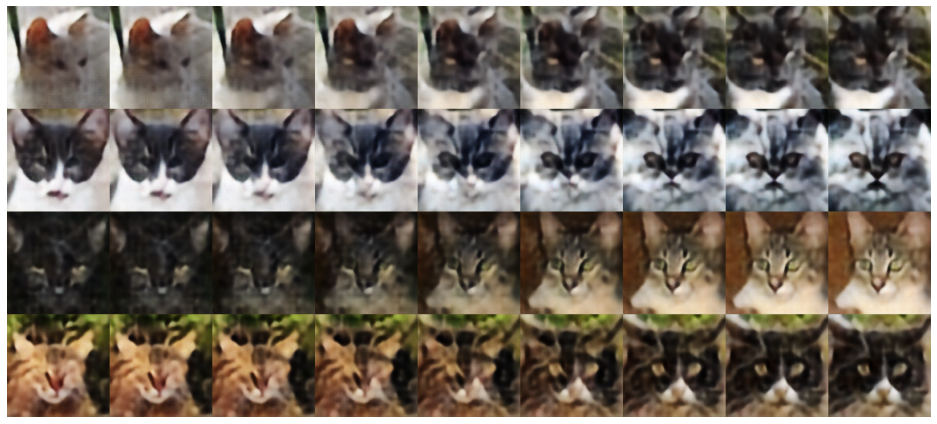

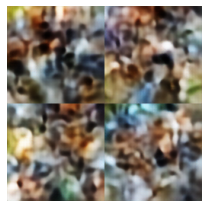

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 101 | Reconstruction loss: 1468.2226119900342 | KLD loss: 917.6730688817753


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 102 | Reconstruction loss: 1462.568518881472 | KLD loss: 912.4108331336738


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 103 | Reconstruction loss: 1467.3419524009184 | KLD loss: 914.8040721253578


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 104 | Reconstruction loss: 1464.6275529565278 | KLD loss: 916.2224008311396


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 105 | Reconstruction loss: 1458.4844725235648 | KLD loss: 912.2617021643597


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 106 | Reconstruction loss: 1461.5471381904176 | KLD loss: 913.0196964429772


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 107 | Reconstruction loss: 1449.9491589469199 | KLD loss: 909.1888225863439


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 108 | Reconstruction loss: 1443.0904417808013 | KLD loss: 907.3539180400209


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 109 | Reconstruction loss: 1449.6332900716652 | KLD loss: 911.4093130360479


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 110 | Reconstruction loss: 1445.830584792617 | KLD loss: 907.2669317589043


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 111 | Reconstruction loss: 1440.8915880096624 | KLD loss: 908.6588427620645


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 112 | Reconstruction loss: 1441.702971843459 | KLD loss: 906.8590518169522


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 113 | Reconstruction loss: 1430.3442753383092 | KLD loss: 905.5471230264036


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 114 | Reconstruction loss: 1428.6909302895112 | KLD loss: 905.7658851576148


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 115 | Reconstruction loss: 1433.8093589640553 | KLD loss: 908.4696029757861


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 116 | Reconstruction loss: 1426.5691425015468 | KLD loss: 909.1073911678717


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 117 | Reconstruction loss: 1428.2450101864265 | KLD loss: 906.7873888667326


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 118 | Reconstruction loss: 1421.0353674088947 | KLD loss: 905.6804693944706


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 119 | Reconstruction loss: 1421.9952123416876 | KLD loss: 906.8190523704386


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 120 | Reconstruction loss: 1416.733761994735 | KLD loss: 904.062001862141


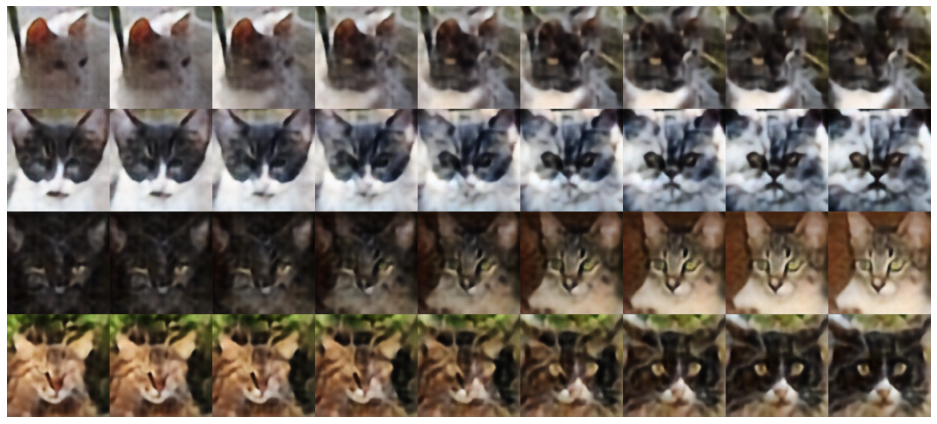

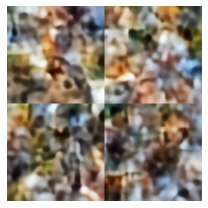

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 121 | Reconstruction loss: 1415.5255893683582 | KLD loss: 904.9328499551145


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 122 | Reconstruction loss: 1413.9787312383237 | KLD loss: 905.4365114010639


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 123 | Reconstruction loss: 1411.3331232485564 | KLD loss: 906.0972327949097


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 124 | Reconstruction loss: 1402.5309587561567 | KLD loss: 901.7204550985964


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 125 | Reconstruction loss: 1405.8469246811007 | KLD loss: 903.0307553688192


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 126 | Reconstruction loss: 1402.235227786236 | KLD loss: 904.1366263442899


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 127 | Reconstruction loss: 1401.7372620387107 | KLD loss: 905.0465084099621


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 128 | Reconstruction loss: 1402.001315004337 | KLD loss: 902.9211333849415


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 129 | Reconstruction loss: 1395.243742285308 | KLD loss: 905.0478625564101


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 130 | Reconstruction loss: 1392.1592809072934 | KLD loss: 903.5881646197776


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 131 | Reconstruction loss: 1388.803247582098 | KLD loss: 901.9762775113123


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 132 | Reconstruction loss: 1388.9890096913214 | KLD loss: 903.6391008270454


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 133 | Reconstruction loss: 1384.67903080342 | KLD loss: 905.3142554241678


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 134 | Reconstruction loss: 1384.629032111316 | KLD loss: 902.1712047505823


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 135 | Reconstruction loss: 1383.678991945634 | KLD loss: 901.5141624308521


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 136 | Reconstruction loss: 1380.0820286910725 | KLD loss: 901.572138721158


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 137 | Reconstruction loss: 1378.212843995657 | KLD loss: 902.7046854718131


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 138 | Reconstruction loss: 1380.9114788363438 | KLD loss: 901.3233831180548


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 139 | Reconstruction loss: 1373.1061554902828 | KLD loss: 900.0123761100058


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 140 | Reconstruction loss: 1375.0198343407294 | KLD loss: 901.7234509391074


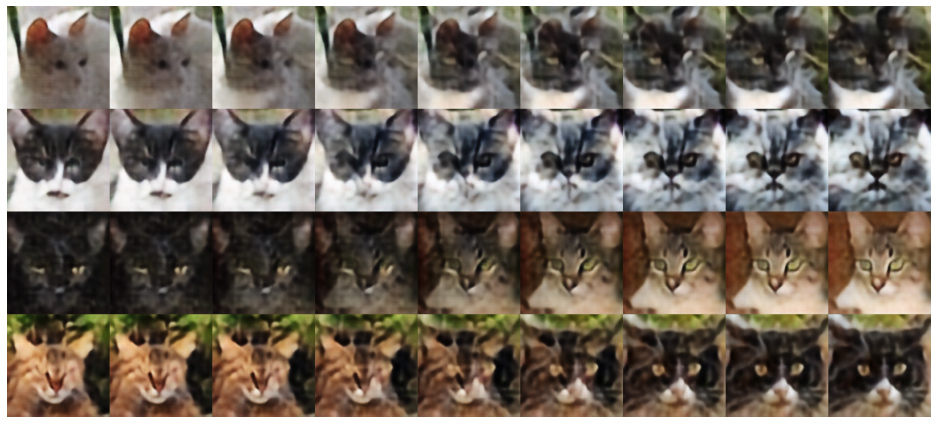

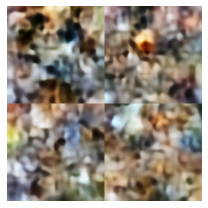

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 141 | Reconstruction loss: 1367.0926745870838 | KLD loss: 898.6646067933266


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 142 | Reconstruction loss: 1370.385009955175 | KLD loss: 899.9695465846091


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 143 | Reconstruction loss: 1371.8257532534392 | KLD loss: 899.9397366920614


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 144 | Reconstruction loss: 1364.071328109836 | KLD loss: 898.8675365566467


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 145 | Reconstruction loss: 1363.8265699303668 | KLD loss: 899.6031615452737


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 146 | Reconstruction loss: 1360.217069353376 | KLD loss: 897.4573792641207


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 147 | Reconstruction loss: 1360.4662504018463 | KLD loss: 896.8224058921293


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 148 | Reconstruction loss: 1356.6484736093082 | KLD loss: 894.4870993098857


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 149 | Reconstruction loss: 1359.2616957196537 | KLD loss: 894.9912579459433


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 150 | Reconstruction loss: 1354.404053966451 | KLD loss: 894.5879855896375


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 151 | Reconstruction loss: 1353.7504126507304 | KLD loss: 894.8864636154649


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 152 | Reconstruction loss: 1349.9767298728043 | KLD loss: 893.8091891270986


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 153 | Reconstruction loss: 1348.6985898225205 | KLD loss: 895.3276019362929


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 154 | Reconstruction loss: 1346.7759681843822 | KLD loss: 892.8746915070907


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 155 | Reconstruction loss: 1348.2771618766074 | KLD loss: 896.288006705527


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 156 | Reconstruction loss: 1349.3878748165155 | KLD loss: 893.8612226403278


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 157 | Reconstruction loss: 1344.1919343367867 | KLD loss: 894.6685259327385


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 158 | Reconstruction loss: 1340.5181986174969 | KLD loss: 893.6490514530158


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 159 | Reconstruction loss: 1341.9494492430124 | KLD loss: 892.7739201895198


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 160 | Reconstruction loss: 1338.35486105214 | KLD loss: 890.9952125312378


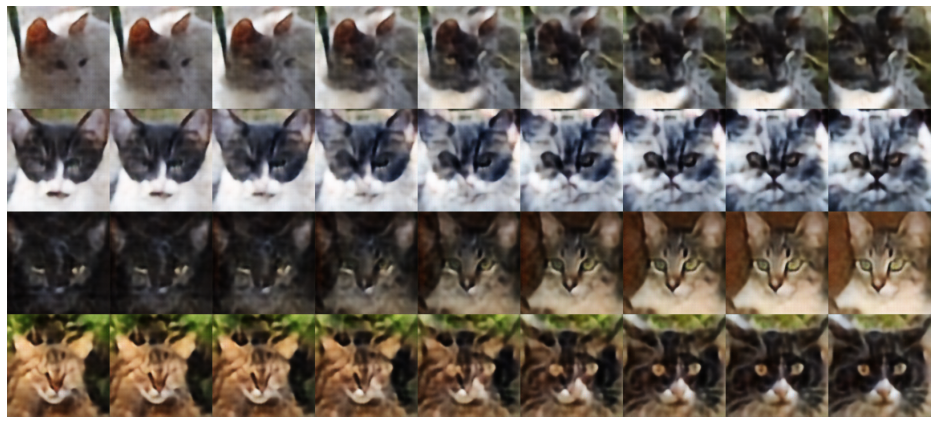

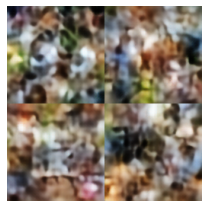

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 161 | Reconstruction loss: 1336.1555314152877 | KLD loss: 893.5456877524808


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 162 | Reconstruction loss: 1334.0692888342817 | KLD loss: 892.1130411847038


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 163 | Reconstruction loss: 1335.3442080479972 | KLD loss: 893.1710504567401


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 164 | Reconstruction loss: 1330.5176011553463 | KLD loss: 891.2160295758929


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 165 | Reconstruction loss: 1337.5689942733102 | KLD loss: 892.4490437951888


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 166 | Reconstruction loss: 1332.3795483512167 | KLD loss: 892.6417696935049


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 167 | Reconstruction loss: 1324.3608847671414 | KLD loss: 891.5273574923876


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 168 | Reconstruction loss: 1326.6328860454678 | KLD loss: 890.7953488367685


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 169 | Reconstruction loss: 1323.0221895964248 | KLD loss: 891.0192277801704


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 170 | Reconstruction loss: 1323.6056884386526 | KLD loss: 891.8195418837648


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 171 | Reconstruction loss: 1323.064639831922 | KLD loss: 893.2384123239458


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 172 | Reconstruction loss: 1322.301677538001 | KLD loss: 892.2012564143779


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 173 | Reconstruction loss: 1322.299892544006 | KLD loss: 891.7496655387167


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 174 | Reconstruction loss: 1320.3605448089031 | KLD loss: 891.1578175799447


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 175 | Reconstruction loss: 1318.1633949042848 | KLD loss: 892.1881863611826


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 176 | Reconstruction loss: 1316.027232957923 | KLD loss: 892.0081721714565


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 177 | Reconstruction loss: 1310.6176636500388 | KLD loss: 891.4992406620001


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 178 | Reconstruction loss: 1308.7871059630968 | KLD loss: 890.7995517327919


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 179 | Reconstruction loss: 1305.8221735983902 | KLD loss: 891.6903107447654


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 180 | Reconstruction loss: 1306.3555133890661 | KLD loss: 893.7521730979777


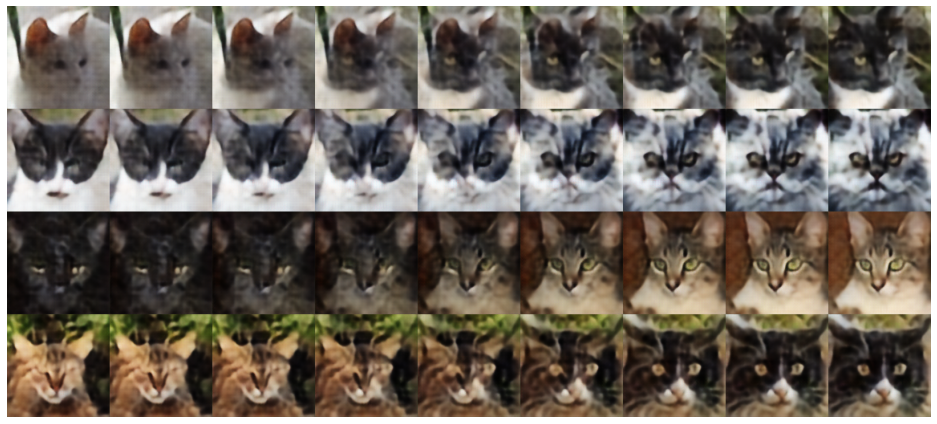

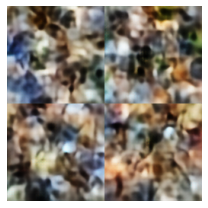

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 181 | Reconstruction loss: 1304.4176821501358 | KLD loss: 893.6792667933872


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 182 | Reconstruction loss: 1305.1922249172044 | KLD loss: 894.1143074746458


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 183 | Reconstruction loss: 1300.410857206546 | KLD loss: 891.0143969044182


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 184 | Reconstruction loss: 1300.9339818539827 | KLD loss: 893.7127150067631


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 185 | Reconstruction loss: 1301.848863968938 | KLD loss: 893.7936741609751


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 186 | Reconstruction loss: 1293.4751511093993 | KLD loss: 895.1377815578295


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 187 | Reconstruction loss: 1294.6198231951792 | KLD loss: 894.7735537890321


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 188 | Reconstruction loss: 1290.7242549161733 | KLD loss: 893.3429978649068


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 189 | Reconstruction loss: 1291.2599624728564 | KLD loss: 894.7350183332929


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 190 | Reconstruction loss: 1289.5252640054832 | KLD loss: 894.2843176800271


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 191 | Reconstruction loss: 1288.8686525333 | KLD loss: 896.6266744862432


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 192 | Reconstruction loss: 1288.3729238569367 | KLD loss: 897.1234267335501


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 193 | Reconstruction loss: 1284.2890967138064 | KLD loss: 896.2173172850046


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 194 | Reconstruction loss: 1283.9009736813373 | KLD loss: 893.7177285141086


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 195 | Reconstruction loss: 1283.1792027254282 | KLD loss: 894.0915374755859


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 196 | Reconstruction loss: 1285.167726789202 | KLD loss: 893.0669475105238


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 197 | Reconstruction loss: 1279.4147632669958 | KLD loss: 893.722686578028


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 198 | Reconstruction loss: 1282.4621157438858 | KLD loss: 895.9623161931956


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 199 | Reconstruction loss: 1280.2579071803123 | KLD loss: 894.574792802704


  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 200 | Reconstruction loss: 1276.404555042338 | KLD loss: 892.7078356061663


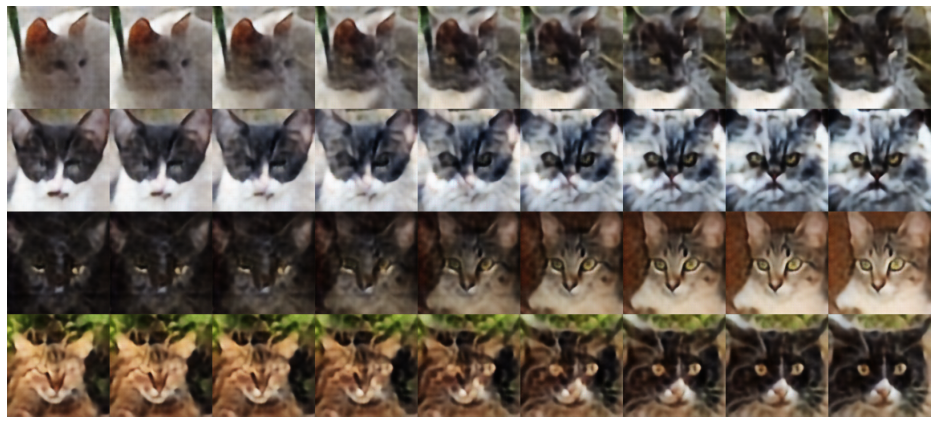

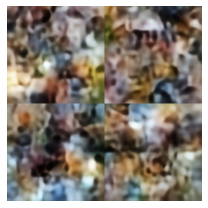

  0%|          | 0/645 [00:00<?, ?it/s]

Epoch 201 | Reconstruction loss: 1277.075307052328 | KLD loss: 892.4408386420018


In [13]:
def train_vae():
    vae = VAE()
    vae.cuda()

    epochs = 201
    batch_size = 8
    vae_optim = Adam(vae.parameters(), lr=1e-4)

    dataset = CatDataset(size=128)

    test_imgs_1 = torch.cat([dataset[i].unsqueeze(0) for i in (0, 34, 76, 1509)])
    test_imgs_2 = torch.cat([dataset[i].unsqueeze(0) for i in (734, 123, 512, 3634)])

    for ep in range(epochs):
        dataloader = DataLoader(dataset, shuffle=True, batch_size=batch_size)
        total_batches = 0
        rec_loss_avg = 0
        kld_loss_avg = 0

        if ep % 20 == 0:
            with torch.no_grad():
                z_1 = vae.encode(test_imgs_1.cuda())
                z_2 = vae.encode(test_imgs_2.cuda())
                x_int = []
                for i in range(9):
                    z = (i * z_1 + (8 - i) * z_2) / 8
                    x_int.append(vae.decode(z))
                x_int = torch.cat(x_int)
                visualise(x_int, rows=len(test_imgs_1))
                z_rand = torch.randn_like(z_1)
                x_int = vae.decode(z_rand)
                visualise(x_int, rows=len(test_imgs_1)//2)

        for i, batch in tqdm(enumerate(dataloader), total=(len(dataset) + batch_size) // batch_size):
            if len(batch) < batch_size:
                continue
            total_batches += 1
            x = batch.cuda()
            x_rec, kld = vae(x)
            img_elems = float(np.prod(list(batch.size())))
            kld_loss = kld.sum() / batch_size
            rec_loss = ((x_rec - x)**2).sum() / batch_size
            loss = rec_loss + 0.1 * kld_loss # https://openreview.net/forum?id=Sy2fzU9gl
            vae_optim.zero_grad()
            loss.backward()
            vae_optim.step()
            kld_loss_avg += kld_loss.item()
            rec_loss_avg += rec_loss.item()

        print(f"Epoch {ep+1} | Reconstruction loss: {rec_loss_avg / total_batches} | KLD loss: {kld_loss_avg / total_batches}")

train_vae()